In [1]:
import datetime
from IPython.display import display
import os
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
import sys
sys.path.extend(['input/sam-optimizer-pytorch', 'input/pytorch-image-models-master'])
from sam import SAM
import time
import torch
from torch.utils.data import DataLoader

In [2]:
from dataset import TrainDataset, ValidDataset
import transforms as cassavatransforms
from train import sam_mixup_epoch, validate_model
from train_objects import get_model, get_optimizer, get_cycle_class_weight, get_lr_scheduler
from util import plot_curve_w_linefit

In [3]:
metadata = pd.read_csv('input/2019_2020_merged/train.csv')
label_map = pd.read_json('input/label_num_to_disease_map.json', typ='series')
keys = list(metadata['image_id'])
labels = list(metadata['label'])
image_map = list(zip(keys, labels))
config = pd.read_json('train_config.json', typ='series')
device = torch.device(config['device'])

torch.manual_seed(config['seed'])
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
np.random.seed(config['seed'])

In [4]:
if config['timestamp'] is None:
    config['timestamp'] = datetime.datetime.now().strftime('%Y-%m-%d_%H-%M-%S')
config

seed                                                     24563
timestamp                                  2021-02-15_14-33-35
total_epochs                                                14
device                                                  cuda:0
model_name                               tf_efficientnet_b7_ns
batch_size                                                  12
target_size                                                512
use_depth_biased_rrc                                      True
rrc_scale_min                                             0.25
rrc_scale_max                                                1
mixup_alpha                                                0.2
base_lr                                                  0.007
momentum                                                   0.9
weight_decay                                             1e-06
class_weight_base_formula                          logarithmic
cycle_class_weight_converge                            

In [5]:
train_image_map, valid_image_map = train_test_split(image_map, test_size=0.05)
train_image_map = shuffle(train_image_map)

print(f'{len(train_image_map)} images in train set, {len(valid_image_map)} in validation set.')

24909 images in train set, 1311 in validation set.


In [6]:
if 'class_weight_base_formula' in config.keys() and config['class_weight_base_formula'] == 'logarithmic':
    inv_class_freq = 1 / metadata.groupby('label').count() 
    inv_class_freq = torch.Tensor(inv_class_freq['source'])
    log_inv_class_freq = torch.log(1 + inv_class_freq)
    base_class_weight = (log_inv_class_freq / log_inv_class_freq
                                 .sum(0)
                                 .expand_as(log_inv_class_freq))
else:
    inv_class_freq = 1 / metadata.groupby('label').count() 
    inv_class_freq = torch.Tensor(inv_class_freq['source'])
    normalized_inv_class_freq = (inv_class_freq / inv_class_freq
                                 .sum(0)
                                 .expand_as(inv_class_freq))
    base_class_weight = normalized_inv_class_freq
    base_class_weight /= torch.mean(base_class_weight)
'''
Class weighting will be modulated according to the class weight scheduler.
Thoughts: Try log scaling of weight?
'''
print('Weighting of classes:', base_class_weight)

Weighting of classes: tensor([0.3933, 0.1700, 0.1947, 0.0380, 0.2041])


In [7]:
if 'use_depth_biased_rrc' in config.keys() and config['use_depth_biased_rrc']:
    train_transforms = cassavatransforms.get_train_transforms()
    train_transforms_transforms_presize, train_transforms_postsize = cassavatransforms.get_presize_combine_transforms()
    valid_transforms = cassavatransforms.get_valid_transforms()
    
    train = TrainDataset(
        image_map=train_image_map,
        input_dir='input/2019_2020_merged/train_images',
        transforms=train_transforms,
        do_mixup=True,
        depth_map_dir='input/2019_2020_merged/depth_maps',
        depth_biased_rrc=True,
        depth_biased_rrc_presize_transforms=train_transforms_transforms_presize,
        depth_biased_rrc_postsize_transforms=train_transforms_postsize)
else:
    train_transforms = cassavatransforms.get_train_transforms()
    valid_transforms = cassavatransforms.get_valid_transforms()

    train = TrainDataset(
        image_map=train_image_map,
        input_dir='input/2019_2020_merged/train_images',
        transforms=train_transforms,
        do_mixup=True)
    
valid = ValidDataset(
    image_map=valid_image_map,
    input_dir='input/2019_2020_merged/train_images',
    transforms=valid_transforms)

train_loader = DataLoader(train, batch_size=config['batch_size'],
                        num_workers=16, drop_last=True, shuffle=True)

valid_loader = DataLoader(valid, batch_size=config['batch_size'],
                        num_workers=16, drop_last=False, shuffle=False)

# Draw some samples

### Train loader

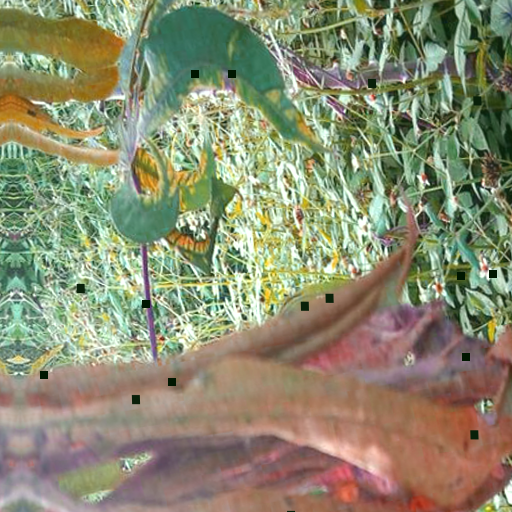

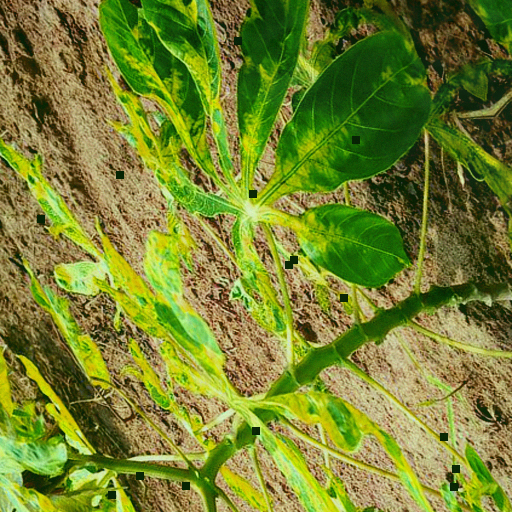

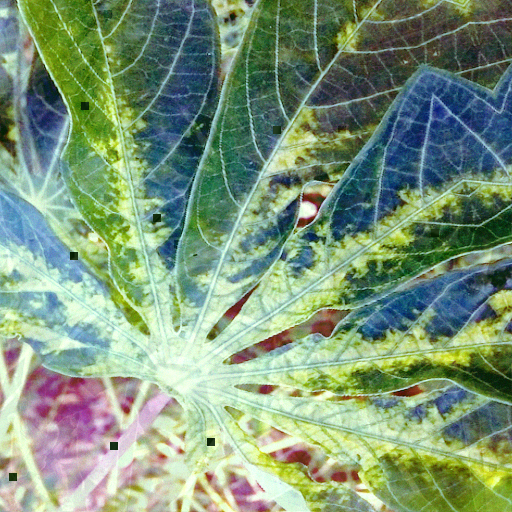

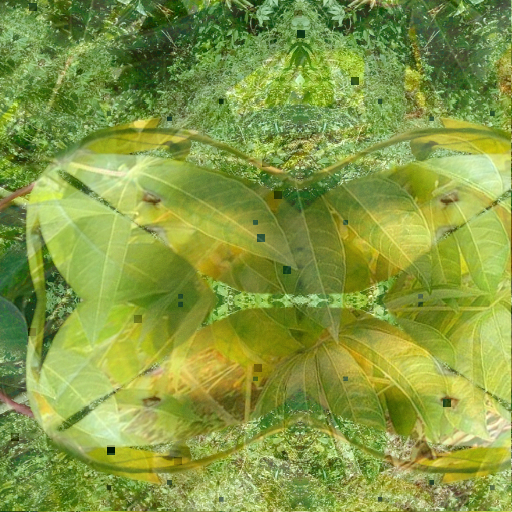

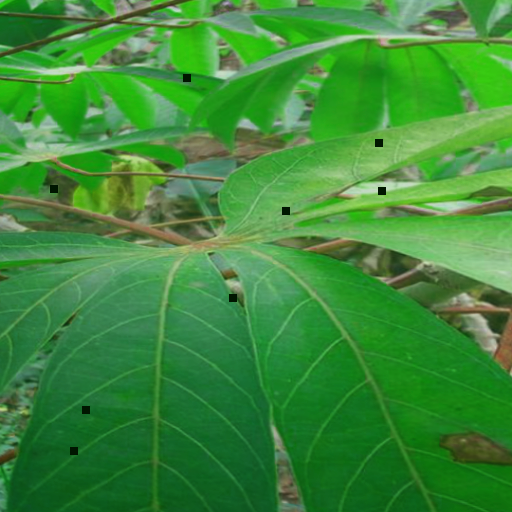

...

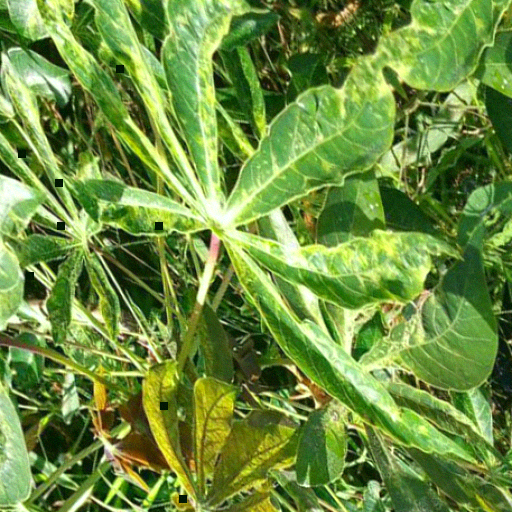

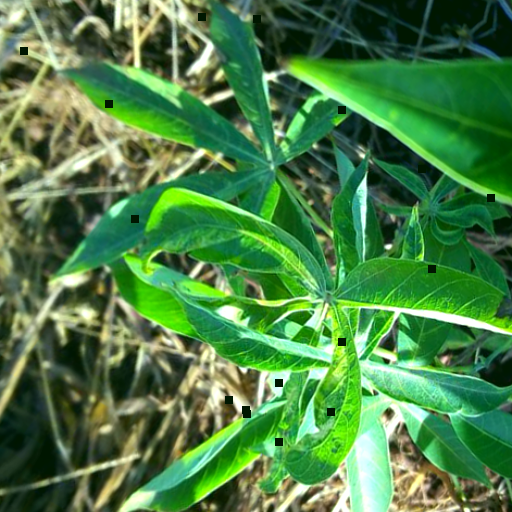

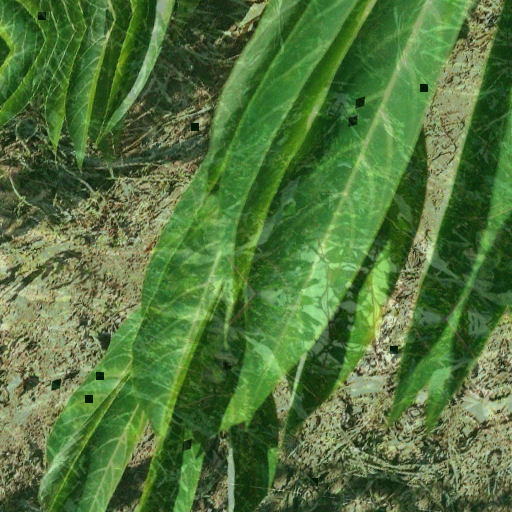

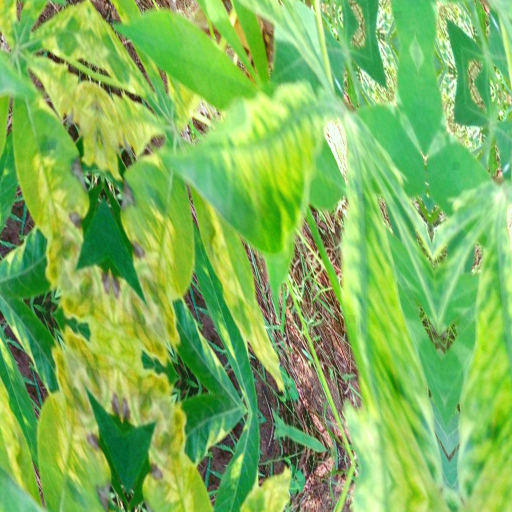

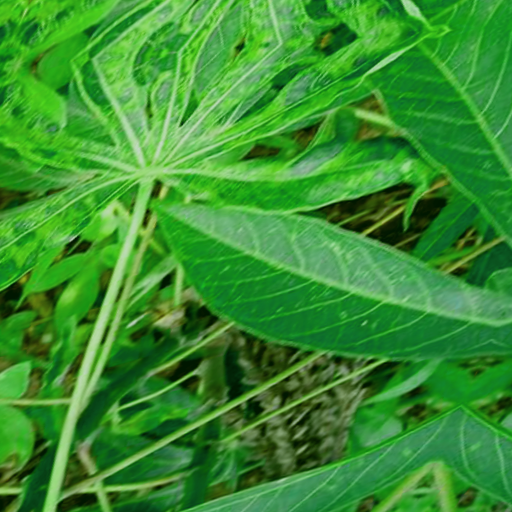

In [10]:
for i in range(20):
    display(train.image_at(i))

### Valid loader

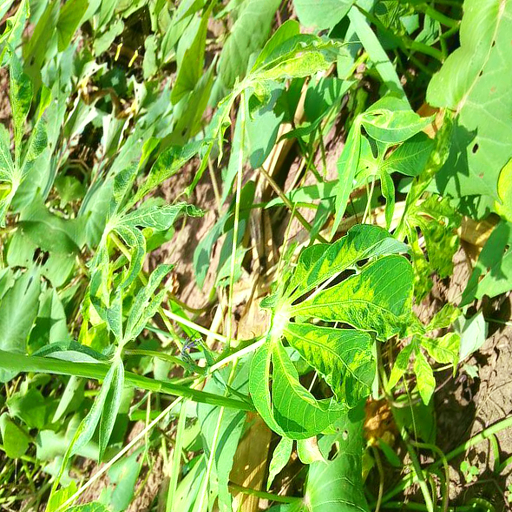

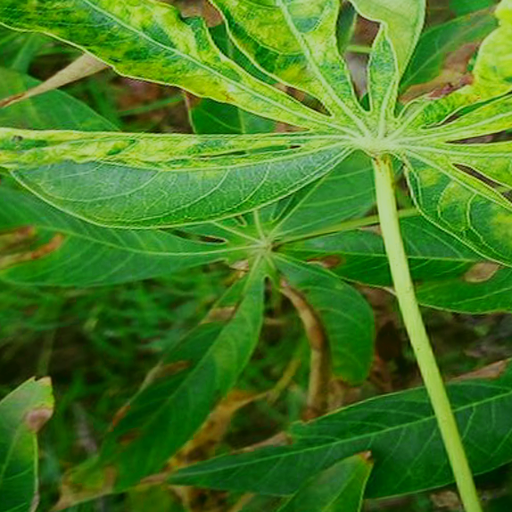

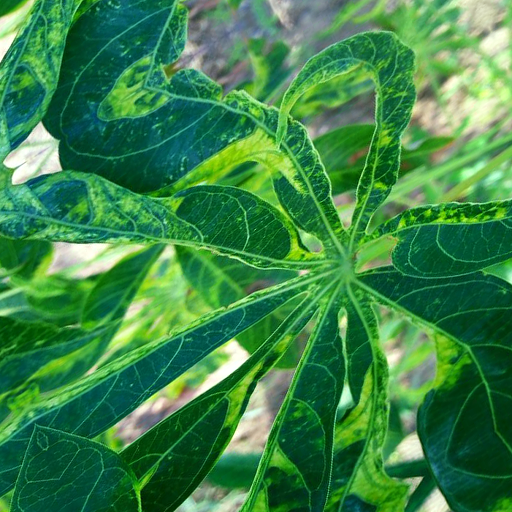

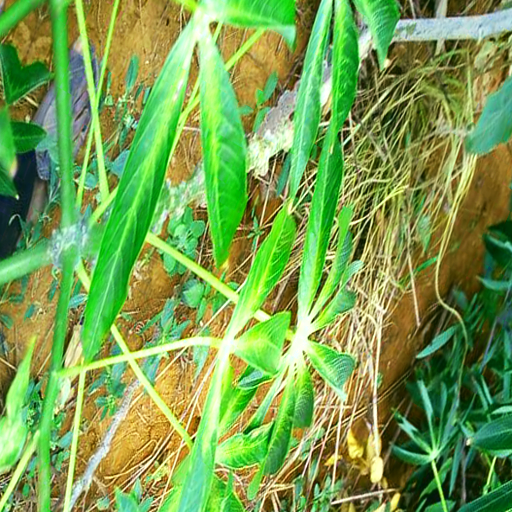

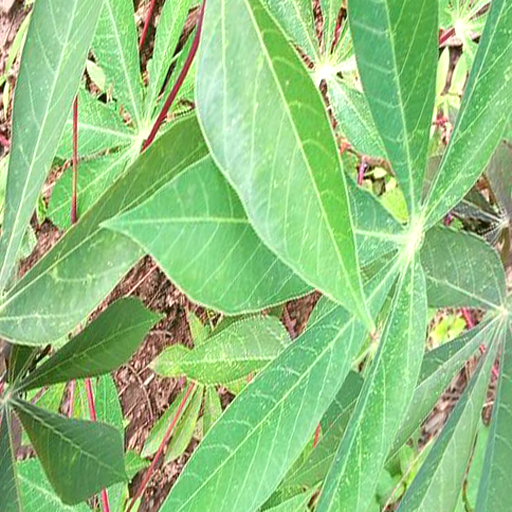

In [11]:
for i in range(5):
    display(valid.image_at(i))

In [12]:
model = get_model()
optimizer = get_optimizer(model)

criterion = torch.nn.CrossEntropyLoss(weight=base_class_weight, reduction='none')
criterion.to(device)

if 'cycle_class_weight_converge' in config.keys() and config['cycle_class_weight_converge'] == True:
    class_weight_scheduler = get_cycle_class_weight(criterion, 
                                                    base_class_weight, 
                                                    converge=True, 
                                                    steps_to_converge=len(train_loader) * config['cycle_class_weight_epochs_to_converge'])
else:
    class_weight_scheduler = get_cycle_class_weight(criterion, base_class_weight)


lr_scheduler = get_lr_scheduler(optimizer, config['total_epochs'], len(train_loader))

# Train

Running batch 2074

/home/raakforce/.local/lib/python3.6/site-packages/torch/optim/lr_scheduler.py:136: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  "https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate", UserWarning)


Running inference on validation batch 109

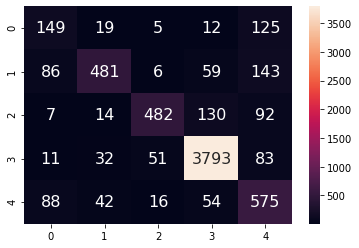

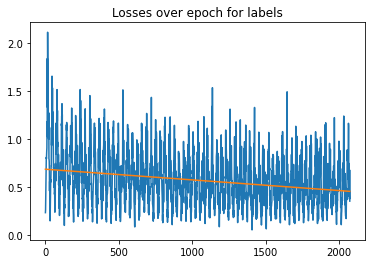

Intercept: 0.6885825447384477, slope: -0.0001107953916403104
Running inference on validation batch 109

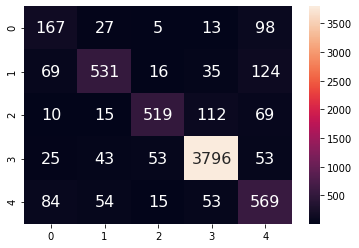

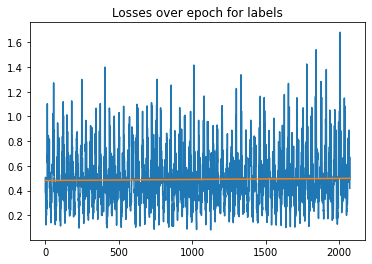

Intercept: 0.48157182825316114, slope: 8.490476800918709e-06
Running inference on validation batch 109

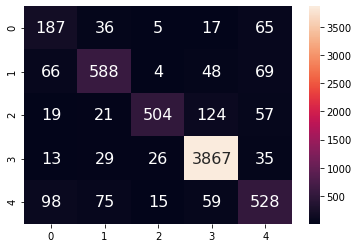

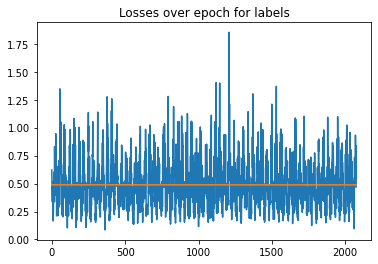

Intercept: 0.4888175317397201, slope: -3.4669293192870697e-07
Running inference on validation batch 109

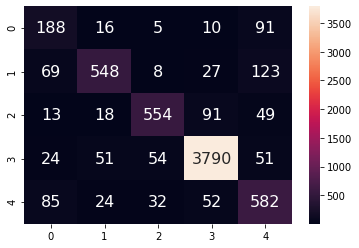

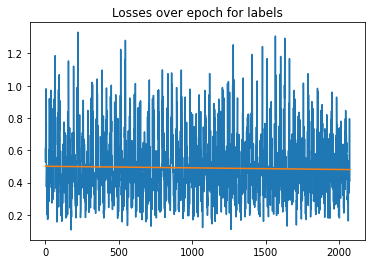

Intercept: 0.5007092908352553, slope: -9.87884427621604e-06
Running batch 1467

KeyboardInterrupt: 

In [13]:
start_time = time.time()
loss_hist = []
train_dir = f"training/train_{config['timestamp']}"
os.makedirs(train_dir)

with open(f'{train_dir}/train_log.csv', 'w+') as train_log:
    train_log.write('epoch_expected_loss_change,valid_accuracy\n')

config.to_json(f'{train_dir}/config.json')

for epoch_i in range(config['total_epochs']):
    model.train()

    losses = sam_mixup_epoch(model, optimizer, criterion, train_loader, lr_scheduler, class_weight_scheduler)
    loss_hist.append(losses)
    if config['lr_scheduler'] == 'multiplicative':
        lr_scheduler.step()
    
    model.eval()
    valid_acc = validate_model(model, valid_loader, f'Epoch {epoch_i}', label_map)
    label_b, label_m = plot_curve_w_linefit(loss_hist[epoch_i], 'Losses over epoch for labels')
    print(f'Intercept: {label_b}, slope: {label_m}')
    torch.save(model, f'{train_dir}/model_epoch_{epoch_i}.pickle')
    
    with open(f'{train_dir}/train_log.csv', 'a') as train_log:
        train_log.write(f'{label_m},{valid_acc}\n')
    
running_time = time.time() - start_time
print(f'Total training time for network: {running_time / 60 / 60} hours.')